## Importing required Libraries

In [1]:
import os
import pandas as pd
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from concurrent.futures import ThreadPoolExecutor
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from tabulate import tabulate
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, roc_curve, accuracy_score, confusion_matrix
import seaborn as sns

## Defining File paths

### Paths are defined to set paths to the train images and the test images and also the paths for the csv file for the train and the test images.

In [2]:
# Paths for the train and test folders are defined here as well as the to csv files for both the train and test set.
train_images_path = './train_images'
test_images_path = './test_images'
train_csv_path = './train.csv'
test_csv_path = './test.csv'

# Load the CSV files
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)

## Image pre-processing

### Using Circle Crop to make all images of same size and a Gaussian blur is applied as well and the images are centered.

In [3]:
# Crops an image by removing surrounding gray or black regions based on a tolerance level.
def crop_image_from_gray(img, tol=7):
    if img.ndim == 2:
        mask = img > tol
        return img[np.ix_(mask.any(1), mask.any(0))]
    elif img.ndim == 3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img > tol
        check_shape = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0]
        if check_shape == 0: 
            return img 
        else:
            img1 = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))]
            img2 = img[:, :, 1][np.ix_(mask.any(1), mask.any(0))]
            img3 = img[:, :, 2][np.ix_(mask.any(1), mask.any(0))]
            img = np.stack([img1, img2, img3], axis=-1)
        return img

### Create circular crop around image centre of the retinal ima
def circle_crop(img_path, sigmaX):
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image not found: {img_path}")
    img = crop_image_from_gray(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width, _ = img.shape
    x = int(width / 2)
    y = int(height / 2)
    r = np.amin((x, y))
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x, y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), sigmaX), -3.6, 128)
    return img

### Loading the images and their required lables

In [4]:
# Preprocess the images
def preprocess_image(image_path, img_size=224, sigmaX=30):
    image = circle_crop(image_path, 30)
    image = cv2.resize(image, (img_size, img_size))
    return image
# Load the single image for faster processing.
def load_single_image(row, images_path, extension='png'):
    image_path = os.path.join(images_path, f"{row['id_code']}.{extension}")
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image file does not exist: {image_path}")
    image = preprocess_image(image_path)
    label = row.get('diagnosis', None)
    return image, label

# Create a function to load and preprocess the training data
def load_data(df, images_path, extension='png'):
    images = []
    labels = []
    with ThreadPoolExecutor() as executor:
        results = list(executor.map(lambda row: load_single_image(row, images_path, extension), [row for _, row in df.iterrows()]))
    for image, label in results:
        images.append(image)
        if label is not None:
            labels.append(label)
    return np.array(images), np.array(labels) if labels else np.array(images)

### Function to display original images as well.

In [5]:
def load_original_image(img_path, img_size=224):
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Image not found: {img_path}")
    img = crop_image_from_gray(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width, _ = img.shape
    x = int(width / 2)
    y = int(height / 2)
    r = np.amin((x, y))
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x, y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    return img

### Loading the Training-set, validation-set and the Test-Set.

In [6]:
# Load training data
train_images, train_labels = load_data(train_df, train_images_path, extension='png')

# Split the data into training and validation sets
train_images, val_images, train_labels, val_labels = train_test_split(train_images, train_labels, test_size=0.2, random_state=42)

# Load test data
test_images, _ = load_data(test_df, test_images_path, extension='png')
print(f"Training images: {train_images.shape}")
print(f"Validation images: {val_images.shape}")
print(f"Test images: {test_images.shape}")



Training images: (2929, 224, 224, 3)
Validation images: (733, 224, 224, 3)
Test images: (1928, 224, 224, 3)


### Displaying Class-distribution of the training data-set:

Number of images per severity label:
Severity 0: 1805 images
Severity 1: 370 images
Severity 2: 999 images
Severity 3: 193 images
Severity 4: 295 images


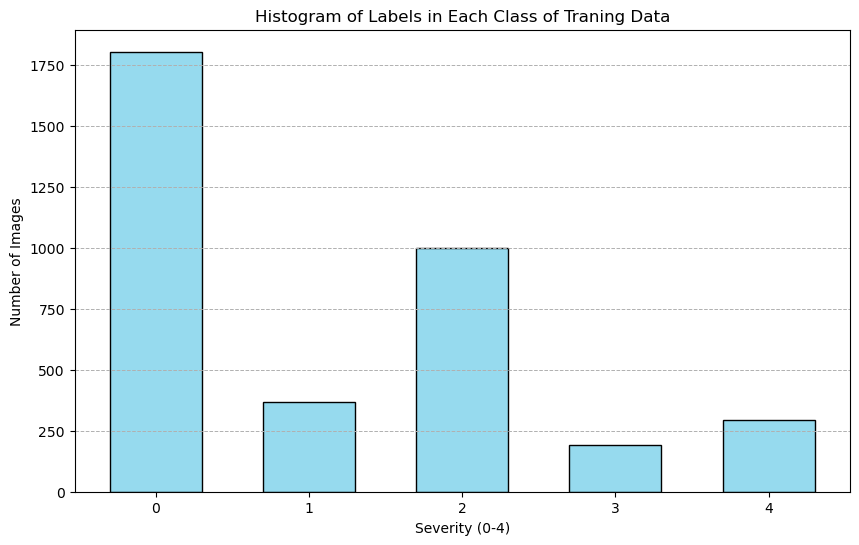

In [7]:
# Load the CSV files
train_csv_path = './train.csv'
train_df = pd.read_csv(train_csv_path)

# Extract the labels from the taining dataset
labels = train_df['diagnosis']

# Count the occurrences of each severity label in the dataset.
label_counts = labels.value_counts().sort_index()

# Print the number of images for each severity label
print("Number of images per severity label:")
for label, count in label_counts.items():
    print(f"Severity {label}: {count} images")

# Plot histogram of the severity labels 0-4
plt.figure(figsize=(10, 6))
plt.bar(label_counts.index, label_counts.values, color='#96daee', edgecolor='black', width=0.6)
plt.xlabel('Severity (0-4)')
plt.ylabel('Number of Images')
plt.title('Histogram of Labels in Each Class of Traning Data')
plt.xticks(ticks=np.arange(5), labels=['0', '1', '2', '3', '4'])
plt.grid(axis='y', linestyle='--', linewidth=0.7)
plt.show()

### Display batch of images.

### Display two images to display difference between a normal retina and a Diabetic Retina.

Sampled normal image ID: 2a93334f663a
Sampled diabetic image ID: c5ba9e455d5e


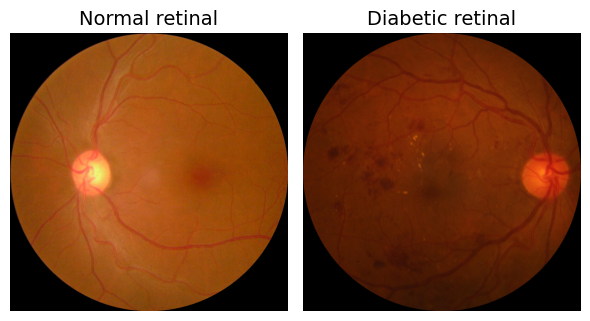

In [8]:
def display_images(df, images_path, img_size=224):
    diag_0 = df[df['diagnosis'] == 0].sample(1)
    diag_3 = df[df['diagnosis'] == 3].sample(1)
    print(f"Sampled normal image ID: {diag_0['id_code'].values[0]}")
    print(f"Sampled diabetic image ID: {diag_3['id_code'].values[0]}")
    image_path_0 = os.path.join(images_path, f"{diag_0['id_code'].values[0]}.png")
    image_path_3 = os.path.join(images_path, f"{diag_3['id_code'].values[0]}.png")
    image_0 = load_original_image(image_path_0, img_size)
    image_3 = load_original_image(image_path_3, img_size)
    fig, axes = plt.subplots(1, 2, figsize=(6, 4))
    axes[0].imshow(image_0)
    axes[0].set_title('Normal retinal', fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(image_3)
    axes[1].set_title('Diabetic retinal', fontsize=14)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

display_images(train_df, train_images_path, img_size=224)

### Displaying images of all different levels of DR.

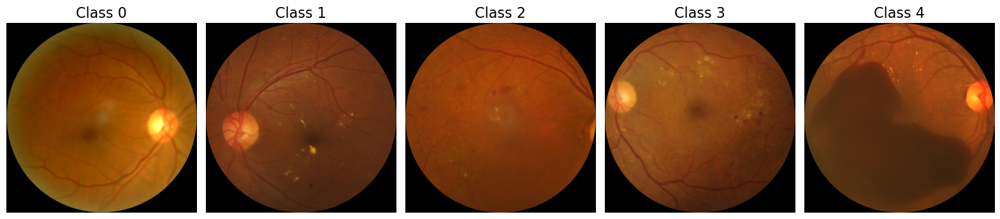

In [9]:
NUM_SAMP = 1
labels = ['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4']
sampled_images = []
for class_id in np.unique(train_labels):
    sampled_images.append(train_df.loc[train_df['diagnosis'] == class_id].sample(NUM_SAMP).iloc[0])
images = []
for row in sampled_images:
    path = os.path.join(train_images_path, f"{row['id_code']}.png")
    image = load_original_image(path, img_size=224)
    images.append(image)
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for i, (ax, img, label) in enumerate(zip(axes.flat, images, labels)):
    ax.imshow(img)
    ax.set_title(label, fontsize=16)
    ax.axis('off')
plt.subplots_adjust(wspace=0.05, hspace=0.1)
plt.show()

### Image samples Visualised after they are they have gone through image pre-processing.

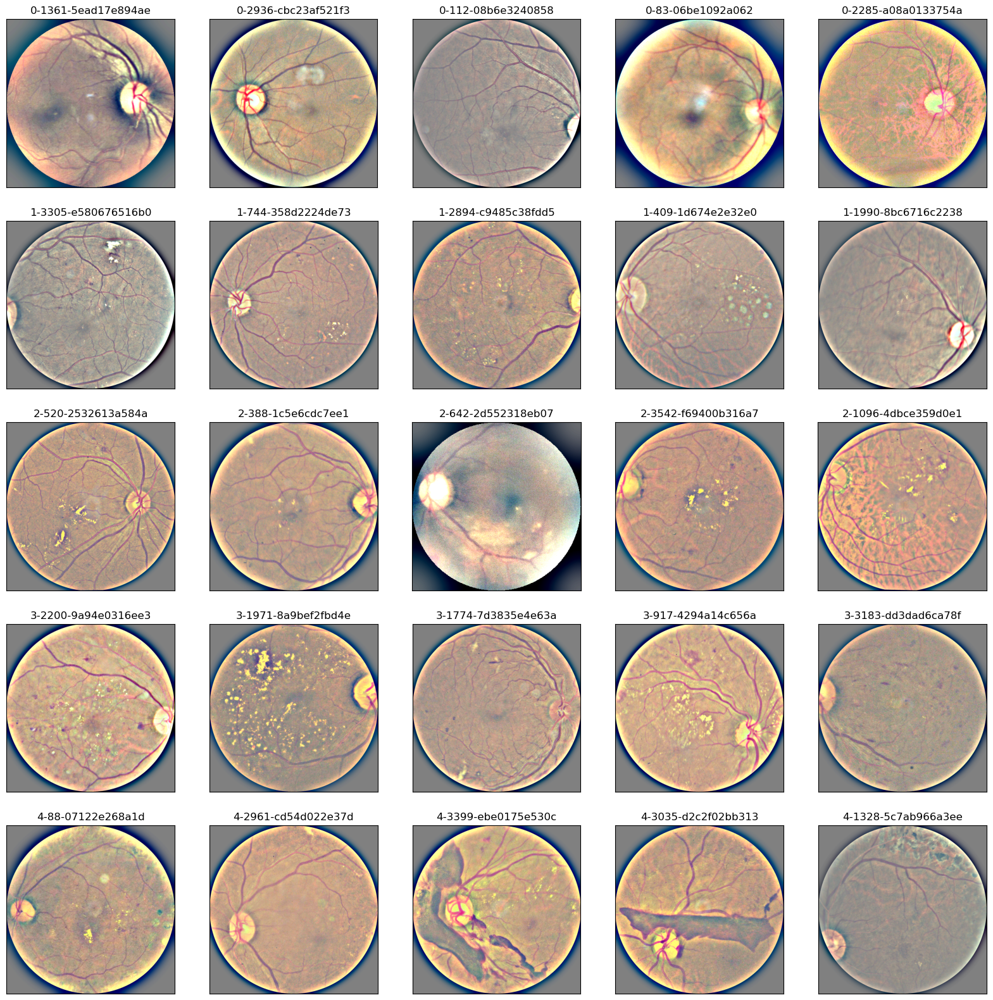

In [10]:
# Visualising the samples after circle crop is done.
NUM_SAMP = 5
fig = plt.figure(figsize=(20, 20))
for class_id in np.unique(train_labels):
    for i, (idx, row) in enumerate(train_df.loc[train_df['diagnosis'] == class_id].sample(NUM_SAMP, random_state=77).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path = os.path.join(train_images_path, f"{row['id_code']}.png")
        image = circle_crop(path, sigmaX=40)
        ax.imshow(image)
        ax.set_title(f'{class_id}-{idx}-{row["id_code"]}')
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.show()

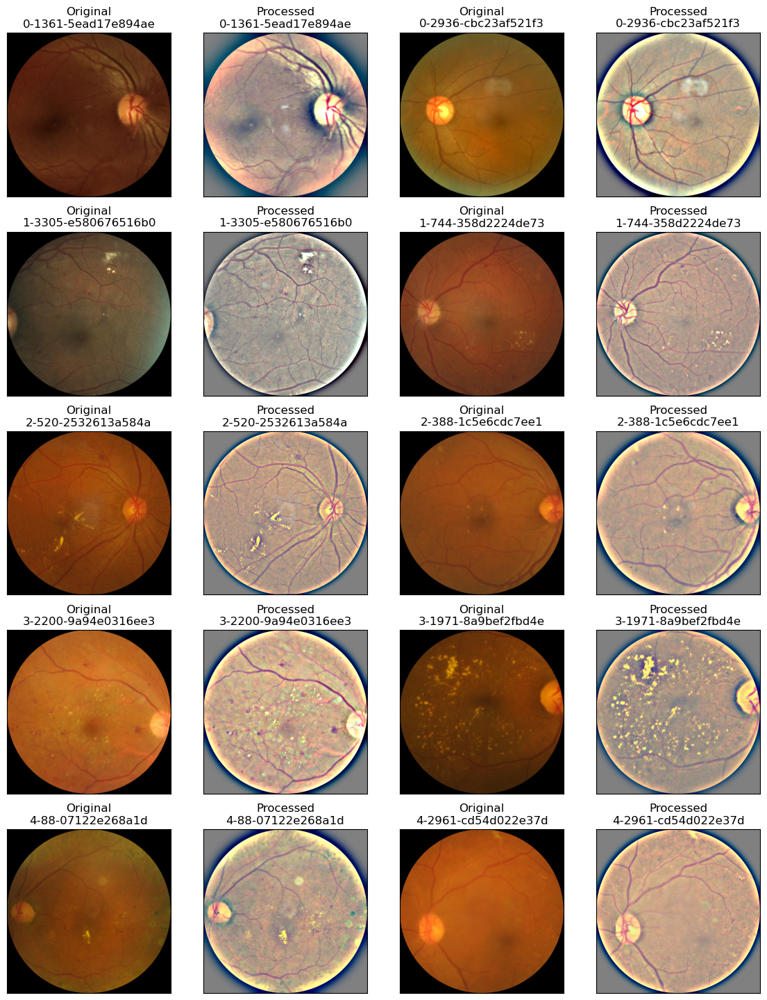

In [11]:
NUM_SAMP = 2
fig, axs = plt.subplots(5, NUM_SAMP * 2, figsize=(14, 18))  
for class_id in np.unique(train_labels):
    for i, (idx, row) in enumerate(train_df.loc[train_df['diagnosis'] == class_id].sample(NUM_SAMP, random_state=77).iterrows()):
        path = os.path.join(train_images_path, f"{row['id_code']}.png")
        original_image = load_original_image(path)
        ax1 = axs[class_id, i * 2]
        ax1.imshow(original_image)
        ax1.set_title(f'Original\n{class_id}-{idx}-{row["id_code"]}')
        ax1.set_xticks([])
        ax1.set_yticks([])
        circle_cropped_image = circle_crop(path, sigmaX=40)
        ax2 = axs[class_id, i * 2 + 1]
        ax2.imshow(circle_cropped_image)
        ax2.set_title(f'Processed\n{class_id}-{idx}-{row["id_code"]}')
        ax2.set_xticks([])
        ax2.set_yticks([])
plt.subplots_adjust(wspace=0.2, hspace=0.2) 
plt.show()

## Data Augumentation

### Data Augmentation for specific classes was done only on 3 classes classes 1,3 and 4 due to high class-imbalace in the dataset. 
#### Initalised train generator and validation generator as well.

In [12]:
augmentation_classes = [1, 3, 4]
augment_gen = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.1
)
normal_gen = ImageDataGenerator()
def selective_augmentation(images, labels, batch_size):
    while True:
        augmented_images = []
        augmented_labels = []
        indices = np.random.permutation(len(images))
        for i in indices:
            image = images[i]
            label = labels[i]
            if label in augmentation_classes:
                image = augment_gen.random_transform(image)
            augmented_images.append(image)
            augmented_labels.append(label)
            if len(augmented_images) == batch_size:
                yield np.array(augmented_images), np.array(augmented_labels)
                augmented_images = []
                augmented_labels = []

# Create data generators
train_generator = selective_augmentation(train_images, train_labels, batch_size=32)
val_generator = selective_augmentation(val_images, val_labels, batch_size=32)

### Graph to display difference between images before and after Data Augmentation.

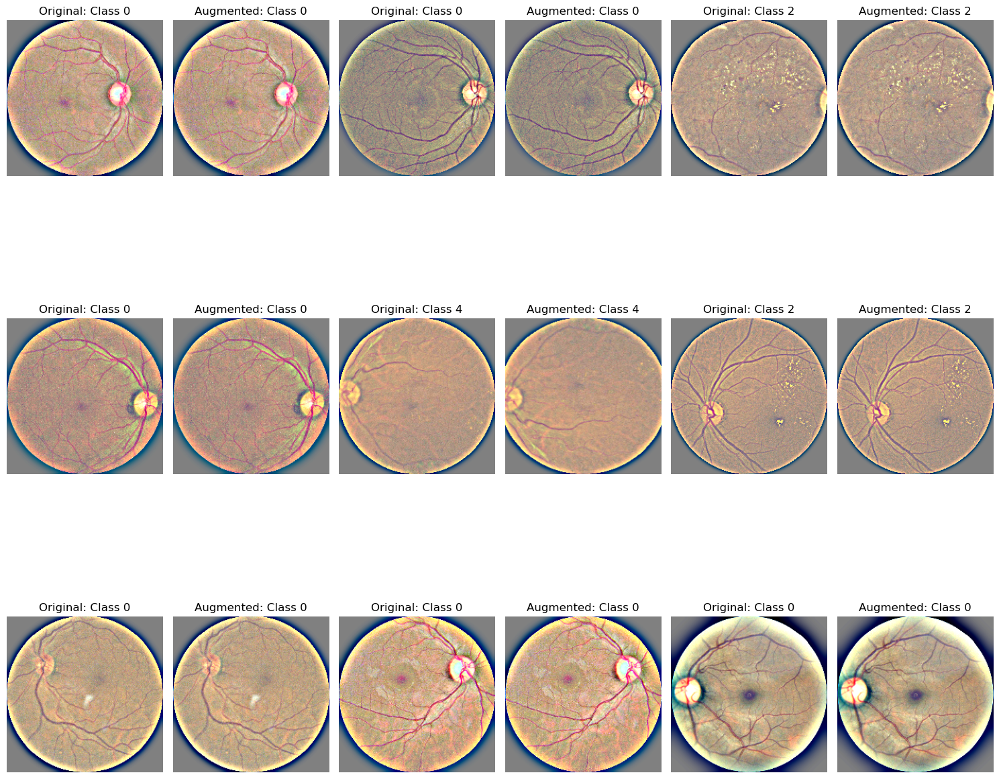

In [13]:
def plot_augmentations(images, labels, augmentation_classes, num_samples=9):
    rows = 3
    cols = 3
    fig, axes = plt.subplots(rows, cols * 2, figsize=(15, 15))
    for i in range(rows):
        for j in range(cols):
            idx = i * cols + j
            img_idx = np.random.choice(len(images))
            image = images[img_idx]
            label = labels[img_idx]
            axes[i, j * 2].imshow(image)
            axes[i, j * 2].set_title(f'Original: Class {label}')
            axes[i, j * 2].axis('off')
            if label in augmentation_classes:
                augmented_image = augment_gen.random_transform(image)
            else:
                augmented_image = image
            axes[i, j * 2 + 1].imshow(augmented_image)
            axes[i, j * 2 + 1].set_title(f'Augmented: Class {label}')
            axes[i, j * 2 + 1].axis('off')
    plt.tight_layout()
    plt.show()
sample_images = train_images[:100]
sample_labels = train_labels[:100]

# Plotting the original and augmented images
plot_augmentations(sample_images, sample_labels, augmentation_classes, num_samples=9)


### Function to display Model loss and Model accuracy graphs.

In [14]:
def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))
    ax1.plot(history.history['accuracy'])
    ax1.plot(history.history['val_accuracy'])
    ax1.set_title('Model accuracy')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.set_ylim(0, 1)
    ax1.legend(['Train', 'Validation'], loc='upper left')
    ax2.plot(history.history['loss'])
    ax2.plot(history.history['val_loss'])
    ax2.set_title('Model loss')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.set_ylim(0, max(max(history.history['loss']), max(history.history['val_loss'])))
    ax2.legend(['Train', 'Validation'], loc='upper left')
    plt.tight_layout() 
    plt.show()

## Model Selection and fine tuning.

### Custom Model Class is created to run all the models from this class only, and some of the metrics are implemented in the callback class.

In [15]:
from tensorflow.keras.applications import VGG16, Xception, InceptionV3, ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback
import time

class MetricsCallback(Callback):
    def __init__(self):
        super(MetricsCallback, self).__init__()
        self.highest_train_accuracy = 0
        self.highest_val_accuracy = 0
        self.lowest_train_loss = float('inf')
        self.lowest_val_loss = float('inf')

    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy')
        val_acc = logs.get('val_accuracy')
        train_loss = logs.get('loss')
        val_loss = logs.get('val_loss')
        if train_acc > self.highest_train_accuracy:
            self.highest_train_accuracy = train_acc
        if val_acc > self.highest_val_accuracy:
            self.highest_val_accuracy = val_acc
        if train_loss < self.lowest_train_loss:
            self.lowest_train_loss = train_loss
        if val_loss < self.lowest_val_loss:
            self.lowest_val_loss = val_loss
            
class CustomModel:
    def __init__(self, base_model_name='VGG16', input_shape=(224, 224, 3), num_classes=5, learning_rate=0.001):
        self.base_model_name = base_model_name
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.learning_rate = learning_rate
        self.model = self.build_model()
        self.metrics_callback = MetricsCallback()
    # Function to Load the base model
    def build_model(self):
        if self.base_model_name == 'VGG16':
            base_model = VGG16(weights='imagenet', include_top=False, input_shape=self.input_shape)
        elif self.base_model_name == 'Xception':
            base_model = Xception(weights='imagenet', include_top=False, input_shape=self.input_shape)
        elif self.base_model_name == 'InceptionV3':
            base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=self.input_shape)
        elif self.base_model_name == 'ResNet50':
            base_model = ResNet50(weights='imagenet', include_top=False, input_shape=self.input_shape)
        else:
            raise ValueError(f"Unsupported model name: {self.base_model_name}")
        # Adding custom layers on top of the base model.
        x = base_model.output
        x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)
        x = BatchNormalization()(x)
        x = MaxPooling2D((2, 2))(x)
        x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)
        x = BatchNormalization()(x)
        x = MaxPooling2D((2, 2))(x)
        x = GlobalAveragePooling2D()(x)
        x = Flatten()(x)
        x = Dense(2048, activation='relu')(x)
        x = Dropout(0.5)(x)
        x = Dense(1024, activation='relu')(x)
        x = Dropout(0.5)(x)
        predictions = Dense(self.num_classes, activation='softmax')(x)
        model = Model(inputs=base_model.input, outputs=predictions)
        # Freezing the layers of the base model
        for layer in base_model.layers:
            layer.trainable = False
        # Compiling the final the model
        model.compile(optimizer=Adam(learning_rate=self.learning_rate), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        return model
    
    def train(self, train_generator, val_generator, train_images, val_images, batch_size=32, epochs=2, callbacks=None):
        if callbacks is None:
            callbacks = []
        callbacks.append(self.metrics_callback)
        start_time = time.time()
        history = self.model.fit(
            train_generator,
            validation_data=val_generator,
            steps_per_epoch=len(train_images) // batch_size,
            validation_steps=len(val_images) // batch_size,
            batch_size=batch_size,
            epochs=epochs,
            callbacks=callbacks
        )
        end_time = time.time()
        training_time = end_time - start_time
        print(f"Training time: {training_time} seconds")
        return history

    def summary(self):
        self.model.summary()

    def print_metrics(self):
        print(f"Highest Train Accuracy so far: {self.metrics_callback.highest_train_accuracy:.4f}")
        print(f"Highest Validation Accuracy so far: {self.metrics_callback.highest_val_accuracy:.4f}")
        print(f"Lowest Train Loss so far: {self.metrics_callback.lowest_train_loss:.4f}")
        print(f"Lowest Validation Loss so far: {self.metrics_callback.lowest_val_loss:.4f}")


### Model 1: VGG16

In [16]:
custom_model = CustomModel(base_model_name='VGG16', input_shape=(224, 224, 3), num_classes=5, learning_rate=0.0001)
custom_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 7, 7, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 7, 7, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │              

 Total params: 22,592,325 (86.18 MB)

 Trainable params: 7,875,589 (30.04 MB)

 Non-trainable params: 14,716,736 (56.14 MB)

### Training the VGG16 model.

In [17]:
history = custom_model.train(train_generator,
                             val_generator, train_images, 
                             val_images, batch_size=32, 
                             epochs=30)

Epoch 1/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.6130 - loss: 1.1575 - val_accuracy: 0.7670 - val_loss: 0.6078
Epoch 2/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.8226 - loss: 0.4765 - val_accuracy: 0.8537 - val_loss: 0.3881
Epoch 3/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 307s 3s/step - accuracy: 0.8488 - loss: 0.3911 - val_accuracy: 0.8267 - val_loss: 0.4300
Epoch 4/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.8699 - loss: 0.3103 - val_accuracy: 0.8665 - val_loss: 0.3601
Epoch 5/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 305s 3s/step - accuracy: 0.8935 - loss: 0.2689 - val_accuracy: 0.8878 - val_loss: 0.3201
Epoch 6/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.8912 - loss: 0.2532 - val_accuracy: 0.8707 - val_loss: 0.3213
Epoch 7/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 306s 3s/step - accuracy: 0.9132 - loss: 0.2173 - val_accuracy: 0.8750 - val_loss: 0.3412
Epoch 8/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 307s 3s/step - accuracy: 0.9020 - loss: 0.2261 - val_accuracy: 0.8906 - v

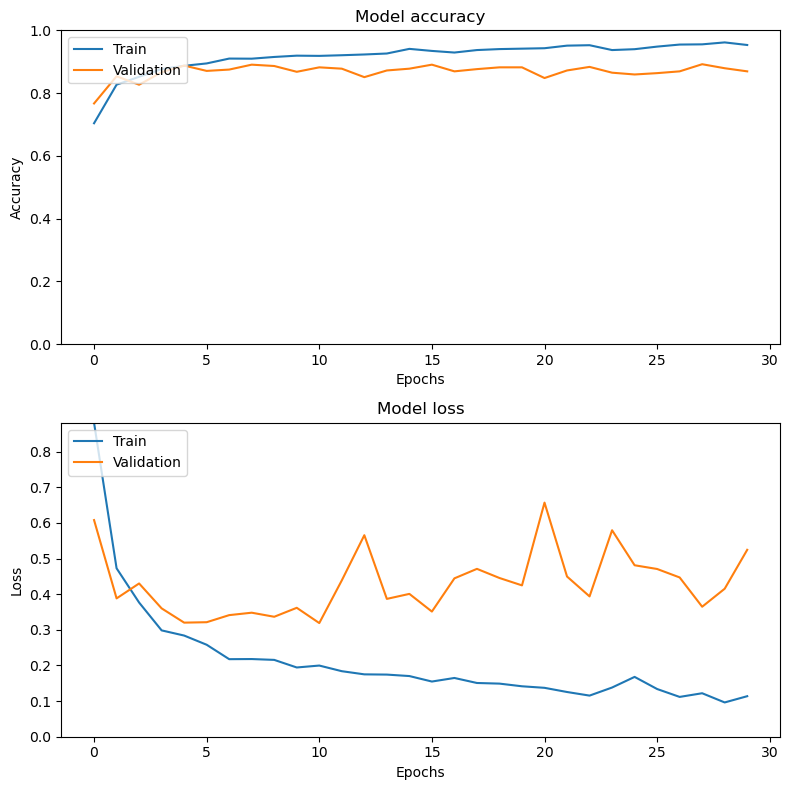

In [18]:
plot_training_history(history)

### Evaluate The VGG16 Model and print the metrics for the model.

In [19]:
custom_model.print_metrics()

Highest Train Accuracy so far: 0.9615
Highest Validation Accuracy so far: 0.8920
Lowest Train Loss so far: 0.0962
Lowest Validation Loss so far: 0.3189


### Results of different metrics (accuracry, f1, recall, precision) for VGG16.

22/22 ━━━━━━━━━━━━━━━━━━━━ 57s 3s/step
+----+---------+-------------+----------+------------+------------+
|    | Class   |   Precision |   Recall |   F1 Score |   Accuracy |
+====+=========+=============+==========+============+============+
|  0 | Class 0 |    0.916201 | 0.979104 |   0.946609 |   0.979104 |
+----+---------+-------------+----------+------------+------------+
|  1 | Class 1 |    0.753086 | 0.938462 |   0.835616 |   0.938462 |
+----+---------+-------------+----------+------------+------------+
|  2 | Class 2 |    0.952128 | 0.852381 |   0.899497 |   0.852381 |
+----+---------+-------------+----------+------------+------------+
|  3 | Class 3 |    0.482759 | 0.4      |   0.4375   |   0.4      |
+----+---------+-------------+----------+------------+------------+
|  4 | Class 4 |    0.645833 | 0.525424 |   0.579439 |   0.525424 |
+----+---------+-------------+----------+------------+------------+
|  5 | Overall |    0.86765  | 0.870739 |   0.866226 |   0.870739 |
+----+---

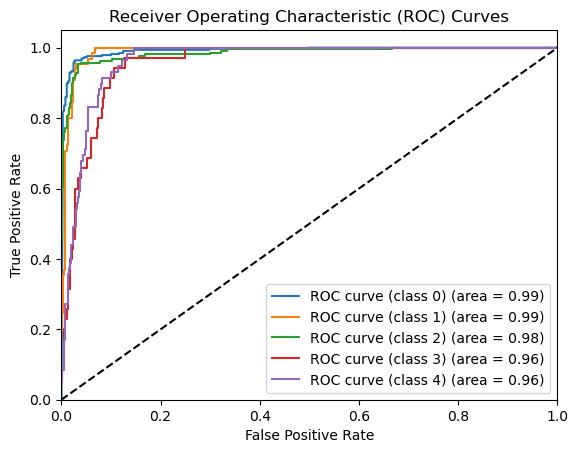

In [20]:
def generate_augmented_data(generator, steps):
    images = []
    labels = []
    for _ in range(steps):
        batch_images, batch_labels = next(generator)
        images.append(batch_images)
        labels.append(batch_labels)
    images = np.vstack(images)
    labels = np.hstack(labels)
    return images, labels
val_steps = len(val_images) // 32
aug_val_images, aug_val_labels = generate_augmented_data(val_generator, val_steps)
y_pred = custom_model.model.predict(aug_val_images)
y_pred_classes = np.argmax(y_pred, axis=1)
precision = precision_score(aug_val_labels, y_pred_classes, average='weighted')
recall = recall_score(aug_val_labels, y_pred_classes, average='weighted')
f1 = f1_score(aug_val_labels, y_pred_classes, average='weighted')
accuracy = accuracy_score(aug_val_labels, y_pred_classes)

class_precisions = precision_score(aug_val_labels, y_pred_classes, average=None)
class_recalls = recall_score(aug_val_labels, y_pred_classes, average=None)
class_f1s = f1_score(aug_val_labels, y_pred_classes, average=None)
class_accuracies = [accuracy_score(aug_val_labels[aug_val_labels == i], y_pred_classes[aug_val_labels == i]) for i in range(5)]

metrics_df = pd.DataFrame({
    'Class': [f'Class {i}' for i in range(5)],
    'Precision': class_precisions,
    'Recall': class_recalls,
    'F1 Score': class_f1s,
    'Accuracy': class_accuracies
})
# Adding the overall metrics to the DataFrame
overall_metrics = pd.DataFrame({
    'Class': ['Overall'],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Accuracy': [accuracy]
})
metrics_df = pd.concat([metrics_df, overall_metrics], ignore_index=True)
print(tabulate(metrics_df, headers='keys', tablefmt='grid'))
# AUC SCORE
auc = roc_auc_score(aug_val_labels, y_pred, multi_class='ovr', average='macro')
print(f"AUC Score: {auc:.4f}")
fpr = {}
tpr = {}
roc_auc = {}
aug_val_labels_one_hot = np.zeros((aug_val_labels.size, aug_val_labels.max() + 1))
aug_val_labels_one_hot[np.arange(aug_val_labels.size), aug_val_labels] = 1
for i in range(5):  
    fpr[i], tpr[i], _ = roc_curve(aug_val_labels_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = roc_auc_score(aug_val_labels_one_hot[:, i], y_pred[:, i])

# Plot the ROC curves.
plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve (class {i}) (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()


### Confusion matrix for VGG16:

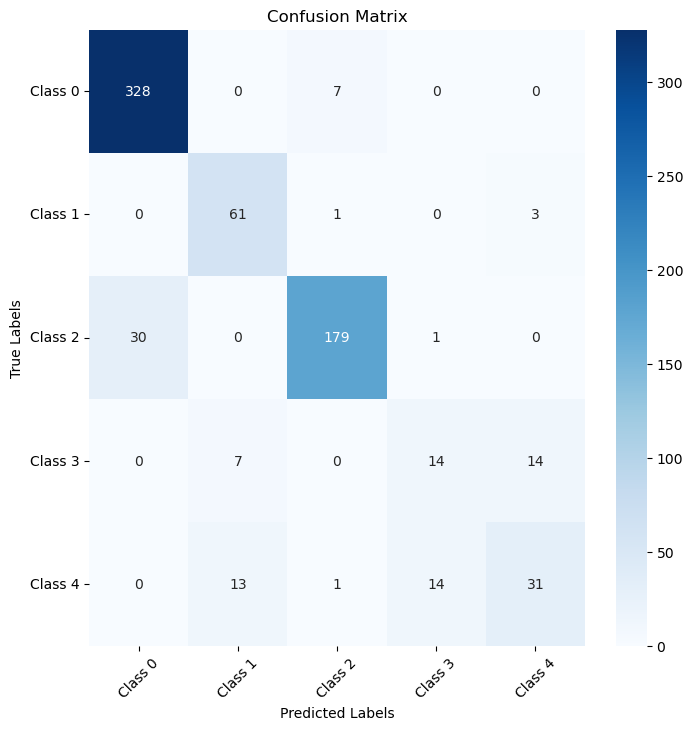

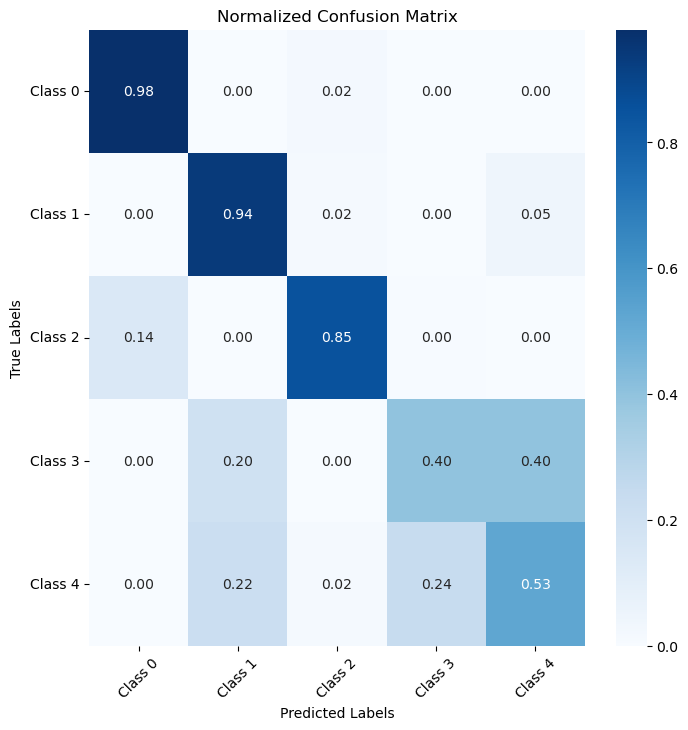

In [21]:
conf_matrix = confusion_matrix(aug_val_labels, y_pred_classes)
conf_matrix_norm = confusion_matrix(aug_val_labels, y_pred_classes, normalize='true')
plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[f'Class {i}' for i in range(5)], yticklabels=[f'Class {i}' for i in range(5)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()
# Plotting normalized confusion matrix
plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix_norm, annot=True, fmt=".2f", cmap='Blues', xticklabels=[f'Class {i}' for i in range(5)], yticklabels=[f'Class {i}' for i in range(5)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Normalized Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

### Model 2: InceptionV3

In [22]:
custom_model = CustomModel(base_model_name='InceptionV3', input_shape=(224, 224, 3), num_classes=5, learning_rate=0.0001)
custom_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_2 (Conv2D)             │ (None, 111, 111, 32)      │             864 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_2         │ (None, 111, 111, 32)      │              96 │ conv2d_2[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation (Activation)       │ (None, 111, 111, 32)      │               0 │ batch_normalization_2[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 109, 109, 32)      │           9,216 │ activation[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_3         │ (None, 109, 109, 32)      │              96 │ conv2d_3[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_1 (Activation)     │ (None, 109, 109, 32)      │               0 │ batch_normalization_3[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 109, 109, 64)      │          18,432 │ activation_1[0][0]         │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_4         │ (None, 109, 109, 64)      │             192 │ conv2d_4[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_2 (Activation)     │ (None, 109, 109, 64)      │               0 │ batch_normalization_4[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_2               │ (None, 54, 54, 64)        │               0 │ activation_2[0][0]         │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_5 (Conv2D)             │ (None, 54, 54, 80)        │           5,120 │ max_pooling2d_2[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_5         │ (None, 54, 54, 80)        │             240 │ conv2d_5[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_3 (Activation)     │ (None, 54, 54, 80)        │               0 │ batch_normalization_5[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_6 (Conv2D)             │ (None, 52, 52, 192)       │         138,24

 Total params: 36,758,309 (140.22 MB)

 Trainable params: 14,953,477 (57.04 MB)

 Non-trainable params: 21,804,832 (83.18 MB)

### Training the Inception Model

In [23]:
history = custom_model.train(train_generator,
                             val_generator, train_images, 
                             val_images, batch_size=32, 
                             epochs=30)

Epoch 1/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.5333 - loss: 1.3654 - val_accuracy: 0.5810 - val_loss: 1.0415
Epoch 2/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.6572 - loss: 0.9341 - val_accuracy: 0.3381 - val_loss: 1.4130
Epoch 3/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.6963 - loss: 0.8129 - val_accuracy: 0.6491 - val_loss: 0.7540
Epoch 4/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7320 - loss: 0.7165 - val_accuracy: 0.7116 - val_loss: 0.7441
Epoch 5/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7456 - loss: 0.6683 - val_accuracy: 0.6293 - val_loss: 0.8315
Epoch 6/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7336 - loss: 0.6686 - val_accuracy: 0.7457 - val_loss: 0.6502
Epoch 7/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.7487 - loss: 0.6251 - val_accuracy: 0.8168 - val_loss: 0.5234
Epoch 8/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.7739 - loss: 0.5799 - val_accuracy: 0.8054 - v

### Model loss and accuracy graphs for Inception Model.

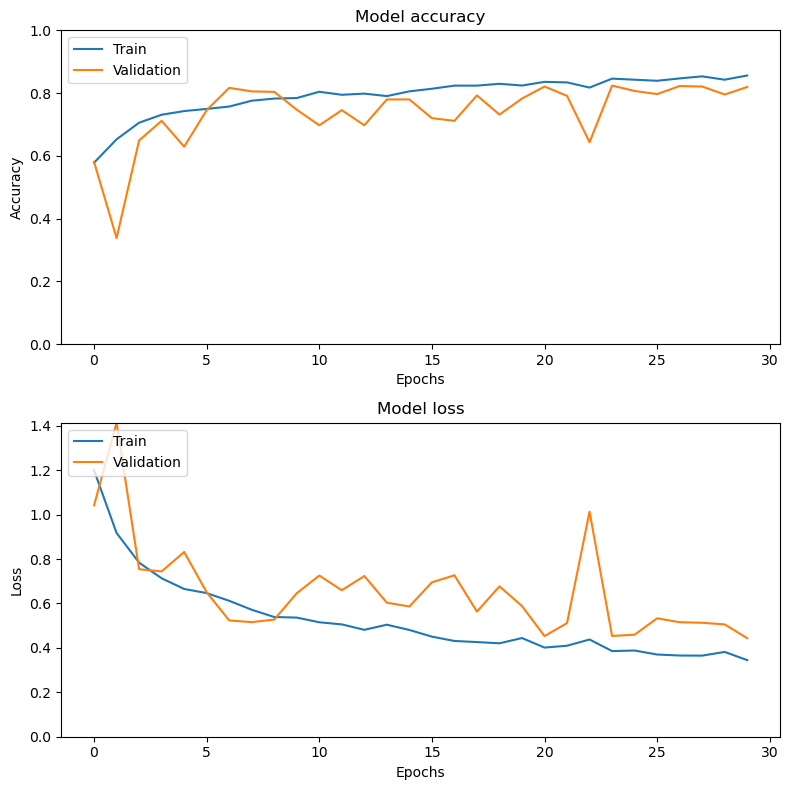

In [24]:
plot_training_history(history)

### Evalute Inception V3 Model

In [25]:
custom_model.print_metrics()

Highest Train Accuracy so far: 0.8561
Highest Validation Accuracy so far: 0.8239
Lowest Train Loss so far: 0.3448
Lowest Validation Loss so far: 0.4435


### Inception Model F1, Preision,Recall and Roc Curve

22/22 ━━━━━━━━━━━━━━━━━━━━ 17s 689ms/step
+----+---------+-------------+----------+------------+------------+
|    | Class   |   Precision |   Recall |   F1 Score |   Accuracy |
+====+=========+=============+==========+============+============+
|  0 | Class 0 |    0.933333 | 0.927711 |   0.930514 |   0.927711 |
+----+---------+-------------+----------+------------+------------+
|  1 | Class 1 |    0.607143 | 0.784615 |   0.684564 |   0.784615 |
+----+---------+-------------+----------+------------+------------+
|  2 | Class 2 |    0.855072 | 0.889447 |   0.871921 |   0.889447 |
+----+---------+-------------+----------+------------+------------+
|  3 | Class 3 |    0.371429 | 0.684211 |   0.481481 |   0.684211 |
+----+---------+-------------+----------+------------+------------+
|  4 | Class 4 |    0.769231 | 0.142857 |   0.240964 |   0.142857 |
+----+---------+-------------+----------+------------+------------+
|  5 | Overall |    0.834447 | 0.8125   |   0.798442 |   0.8125   |
+----+

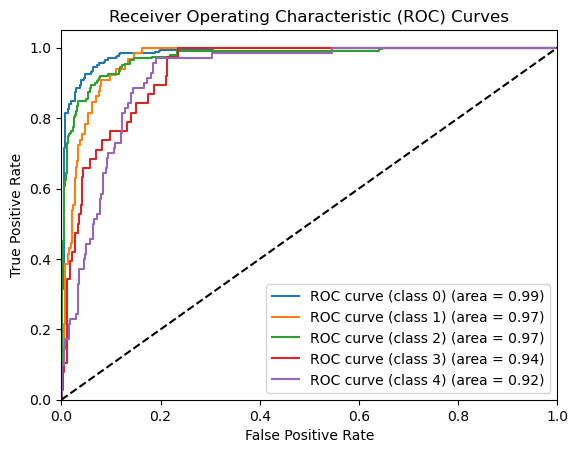

In [26]:
def generate_augmented_data(generator, steps):
    images = []
    labels = []
    for _ in range(steps):
        batch_images, batch_labels = next(generator)
        images.append(batch_images)
        labels.append(batch_labels)
    images = np.vstack(images)
    labels = np.hstack(labels)
    return images, labels

val_steps = len(val_images) // 32
aug_val_images, aug_val_labels = generate_augmented_data(val_generator, val_steps)
y_pred = custom_model.model.predict(aug_val_images)
y_pred_classes = np.argmax(y_pred, axis=1)
precision = precision_score(aug_val_labels, y_pred_classes, average='weighted')
recall = recall_score(aug_val_labels, y_pred_classes, average='weighted')
f1 = f1_score(aug_val_labels, y_pred_classes, average='weighted')
accuracy = accuracy_score(aug_val_labels, y_pred_classes)
class_precisions = precision_score(aug_val_labels, y_pred_classes, average=None)
class_recalls = recall_score(aug_val_labels, y_pred_classes, average=None)
class_f1s = f1_score(aug_val_labels, y_pred_classes, average=None)
class_accuracies = [accuracy_score(aug_val_labels[aug_val_labels == i], y_pred_classes[aug_val_labels == i]) for i in range(5)]

metrics_df = pd.DataFrame({
    'Class': [f'Class {i}' for i in range(5)],
    'Precision': class_precisions,
    'Recall': class_recalls,
    'F1 Score': class_f1s,
    'Accuracy': class_accuracies
})

overall_metrics = pd.DataFrame({
    'Class': ['Overall'],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Accuracy': [accuracy]
})

metrics_df = pd.concat([metrics_df, overall_metrics], ignore_index=True)
print(tabulate(metrics_df, headers='keys', tablefmt='grid'))
auc = roc_auc_score(aug_val_labels, y_pred, multi_class='ovr', average='macro')
print(f"AUC Score: {auc:.4f}")

fpr = {}
tpr = {}
roc_auc = {}

aug_val_labels_one_hot = np.zeros((aug_val_labels.size, aug_val_labels.max() + 1))
aug_val_labels_one_hot[np.arange(aug_val_labels.size), aug_val_labels] = 1

for i in range(5): 
    fpr[i], tpr[i], _ = roc_curve(aug_val_labels_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = roc_auc_score(aug_val_labels_one_hot[:, i], y_pred[:, i])
# Plotting the ROC curves.
plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve (class {i}) (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()


### Model 3: Xception

In [27]:
custom_model = CustomModel(base_model_name='Xception', input_shape=(224, 224, 3), num_classes=5, learning_rate=0.0001)
custom_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1_conv1 (Conv2D)         │ (None, 111, 111, 32)      │             864 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1_conv1_bn               │ (None, 111, 111, 32)      │             128 │ block1_conv1[0][0]         │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1_conv1_act (Activation) │ (None, 111, 111, 32)      │               0 │ block1_conv1_bn[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1_conv2 (Conv2D)         │ (None, 109, 109, 64)      │          18,432 │ block1_conv1_act[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1_conv2_bn               │ (None, 109, 109, 64)      │             256 │ block1_conv2[0][0]         │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1_conv2_act (Activation) │ (None, 109, 109, 64)      │               0 │ block1_conv2_bn[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block2_sepconv1               │ (None, 109, 109, 128)     │           8,768 │ block1_conv2_act[0][0]     │
│ (SeparableConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block2_sepconv1_bn            │ (None, 109, 109, 128)     │             512 │ block2_sepconv1[0][0]      │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block2_sepconv2_act           │ (None, 109, 109, 128)     │               0 │ block2_sepconv1_bn[0][0]   │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block2_sepconv2               │ (None, 109, 109, 128)     │          17,536 │ block2_sepconv2_act[0][0]  │
│ (SeparableConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block2_sepconv2_bn            │ (None, 109, 109, 128)     │             512 │ block2_sepconv2[0][0]      │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_98 (Conv2D)            │ (None, 55, 55, 128)       │           8,192 │ block1_conv2_act[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block2_pool (MaxPooling2D)    │ (None, 55, 55, 128)       │               

 Total params: 35,817,005 (136.63 MB)

 Trainable params: 14,953,477 (57.04 MB)

 Non-trainable params: 20,863,528 (79.59 MB)

### Training the Xception Model

In [28]:
history = custom_model.train(train_generator,
                             val_generator, train_images, 
                             val_images, batch_size=32, 
                             epochs=30)

Epoch 1/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.5560 - loss: 1.3903 - val_accuracy: 0.6918 - val_loss: 0.8314
Epoch 2/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - accuracy: 0.6648 - loss: 0.9336 - val_accuracy: 0.7401 - val_loss: 0.6994
Epoch 3/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - accuracy: 0.7048 - loss: 0.7710 - val_accuracy: 0.7259 - val_loss: 0.7473
Epoch 4/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 178s 2s/step - accuracy: 0.7093 - loss: 0.7890 - val_accuracy: 0.7173 - val_loss: 0.7511
Epoch 5/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.7375 - loss: 0.6938 - val_accuracy: 0.7528 - val_loss: 0.6410
Epoch 6/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.7631 - loss: 0.6304 - val_accuracy: 0.7784 - val_loss: 0.6122
Epoch 7/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.7626 - loss: 0.6188 - val_accuracy: 0.7798 - val_loss: 0.6294
Epoch 8/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 179s 2s/step - accuracy: 0.7700 - loss: 0.6102 - val_accuracy: 0.7713 - v

### Model loss and accuracy Graphs for Xception Model

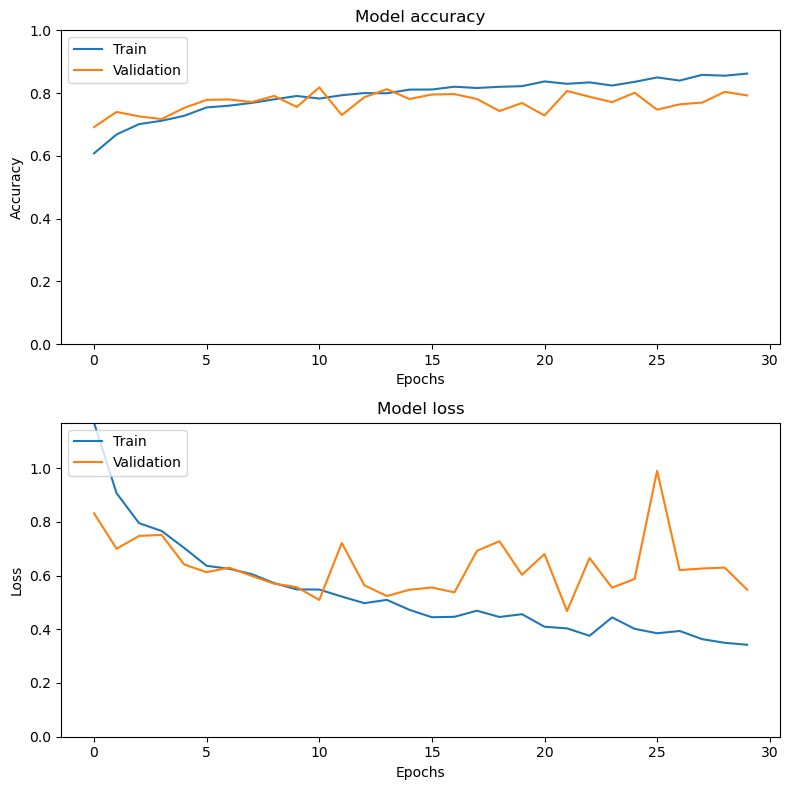

In [29]:
plot_training_history(history)

### Evalute Metrics for Xception Model

In [30]:
custom_model.print_metrics()

Highest Train Accuracy so far: 0.8623
Highest Validation Accuracy so far: 0.8182
Lowest Train Loss so far: 0.3422
Lowest Validation Loss so far: 0.4677


### Xception Model F1,Precision,Recall and Roc curve

22/22 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step
+----+---------+-------------+-----------+------------+------------+
|    | Class   |   Precision |    Recall |   F1 Score |   Accuracy |
+====+=========+=============+===========+============+============+
|  0 | Class 0 |    0.946746 | 0.938416  |   0.942563 |  0.938416  |
+----+---------+-------------+-----------+------------+------------+
|  1 | Class 1 |    0.489796 | 0.774194  |   0.6      |  0.774194  |
+----+---------+-------------+-----------+------------+------------+
|  2 | Class 2 |    0.873684 | 0.817734  |   0.844784 |  0.817734  |
+----+---------+-------------+-----------+------------+------------+
|  3 | Class 3 |    0.328571 | 0.621622  |   0.429907 |  0.621622  |
+----+---------+-------------+-----------+------------+------------+
|  4 | Class 4 |    0.5      | 0.0655738 |   0.115942 |  0.0655738 |
+----+---------+-------------+-----------+------------+------------+
|  5 | Overall |    0.814237 | 0.796875  |   0.785631 |  0.79687

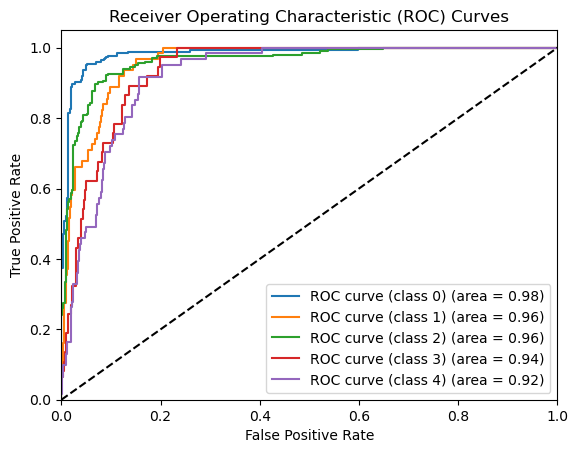

In [31]:
def generate_augmented_data(generator, steps):
    images = []
    labels = []
    for _ in range(steps):
        batch_images, batch_labels = next(generator)
        images.append(batch_images)
        labels.append(batch_labels)
    images = np.vstack(images)
    labels = np.hstack(labels)
    return images, labels
val_steps = len(val_images) // 32
aug_val_images, aug_val_labels = generate_augmented_data(val_generator, val_steps)
y_pred = custom_model.model.predict(aug_val_images)
y_pred_classes = np.argmax(y_pred, axis=1)
precision = precision_score(aug_val_labels, y_pred_classes, average='weighted')
recall = recall_score(aug_val_labels, y_pred_classes, average='weighted')
f1 = f1_score(aug_val_labels, y_pred_classes, average='weighted')
accuracy = accuracy_score(aug_val_labels, y_pred_classes)
class_precisions = precision_score(aug_val_labels, y_pred_classes, average=None)
class_recalls = recall_score(aug_val_labels, y_pred_classes, average=None)
class_f1s = f1_score(aug_val_labels, y_pred_classes, average=None)
class_accuracies = [accuracy_score(aug_val_labels[aug_val_labels == i], y_pred_classes[aug_val_labels == i]) for i in range(5)]
metrics_df = pd.DataFrame({
    'Class': [f'Class {i}' for i in range(5)],
    'Precision': class_precisions,
    'Recall': class_recalls,
    'F1 Score': class_f1s,
    'Accuracy': class_accuracies
})
overall_metrics = pd.DataFrame({
    'Class': ['Overall'],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Accuracy': [accuracy]
})
metrics_df = pd.concat([metrics_df, overall_metrics], ignore_index=True)
print(tabulate(metrics_df, headers='keys', tablefmt='grid'))
auc = roc_auc_score(aug_val_labels, y_pred, multi_class='ovr', average='macro')
print(f"AUC Score: {auc:.4f}")

# Plotting the ROC curves.
fpr = {}
tpr = {}
roc_auc = {}

aug_val_labels_one_hot = np.zeros((aug_val_labels.size, aug_val_labels.max() + 1))
aug_val_labels_one_hot[np.arange(aug_val_labels.size), aug_val_labels] = 1
for i in range(5):  # assuming there are 5 classes
    fpr[i], tpr[i], _ = roc_curve(aug_val_labels_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = roc_auc_score(aug_val_labels_one_hot[:, i], y_pred[:, i])
# Plotting the ROC curves.
plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve (class {i}) (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()

### Model 4: Resnet 50

In [32]:
custom_model = CustomModel(base_model_name='ResNet50', input_shape=(224, 224, 3), num_classes=5, learning_rate=0.0001)
custom_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 230, 230, 3)       │               0 │ input_layer_3[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 112, 112, 64)      │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_bn (BatchNormalization) │ (None, 112, 112, 64)      │             256 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_relu (Activation)       │ (None, 112, 112, 64)      │               0 │ conv1_bn[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 114, 114, 64)      │               0 │ conv1_relu[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 56, 56, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 56, 56, 64)        │           4,160 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 56, 56, 64)        │          36,928 │ conv2_block1_1_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 56, 56, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 56, 56, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_conv (Conv2D)  │ (None, 56, 56, 256)       │          16,640 │ pool1_pool[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_3_conv (Conv2D)  │ (None, 56, 56, 256)       │          16,640 │ conv2_block1_2_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 38,543,237 (147.03 MB)

 Trainable params: 14,953,477 (57.04 MB)

 Non-trainable params: 23,589,760 (89.99 MB)

### Training the Resnet 50 Model.

In [33]:
history = custom_model.train(train_generator,
                             val_generator, train_images, 
                             val_images, batch_size=32, 
                             epochs=30)

Epoch 1/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 163s 2s/step - accuracy: 0.6347 - loss: 1.0427 - val_accuracy: 0.7955 - val_loss: 0.5039
Epoch 2/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.8478 - loss: 0.4071 - val_accuracy: 0.8608 - val_loss: 0.3607
Epoch 3/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.8596 - loss: 0.3672 - val_accuracy: 0.8466 - val_loss: 0.3616
Epoch 4/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.8901 - loss: 0.2604 - val_accuracy: 0.8494 - val_loss: 0.3031
Epoch 5/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.8966 - loss: 0.2357 - val_accuracy: 0.8793 - val_loss: 0.3064
Epoch 6/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 155s 2s/step - accuracy: 0.8916 - loss: 0.2508 - val_accuracy: 0.9105 - val_loss: 0.2893
Epoch 7/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - accuracy: 0.8942 - loss: 0.2657 - val_accuracy: 0.8864 - val_loss: 0.3526
Epoch 8/30
91/91 ━━━━━━━━━━━━━━━━━━━━ 156s 2s/step - accuracy: 0.9066 - loss: 0.2033 - val_accuracy: 0.8920 - v

### Plotting the graphs for model loss and accuracy.

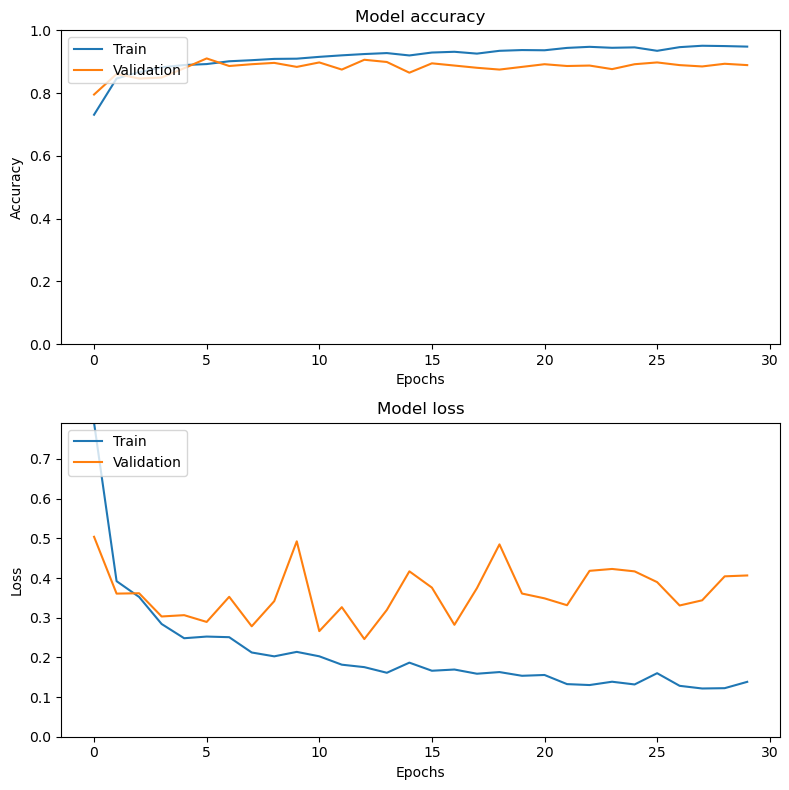

In [34]:
plot_training_history(history)

### Evaluate Resnet 50 Model

In [35]:
custom_model.print_metrics()

Highest Train Accuracy so far: 0.9509
Highest Validation Accuracy so far: 0.9105
Lowest Train Loss so far: 0.1215
Lowest Validation Loss so far: 0.2461


### Resnet 50 Model Precision,F1,recall and ROC curve

In [36]:
pip install tabulate

22/22 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step
+----+---------+-------------+----------+------------+------------+
|    | Class   |   Precision |   Recall |   F1 Score |   Accuracy |
+====+=========+=============+==========+============+============+
|  0 | Class 0 |    0.971591 | 0.968839 |   0.970213 |   0.968839 |
+----+---------+-------------+----------+------------+------------+
|  1 | Class 1 |    0.802817 | 0.876923 |   0.838235 |   0.876923 |
+----+---------+-------------+----------+------------+------------+
|  2 | Class 2 |    0.943005 | 0.947917 |   0.945455 |   0.947917 |
+----+---------+-------------+----------+------------+------------+
|  3 | Class 3 |    0.451613 | 0.424242 |   0.4375   |   0.424242 |
+----+---------+-------------+----------+------------+------------+
|  4 | Class 4 |    0.666667 | 0.622951 |   0.644068 |   0.622951 |
+----+---------+-------------+----------+------------+------------+
|  5 | Overall |    0.897417 | 0.899148 |   0.898044 |   0.899148 |
+----+---

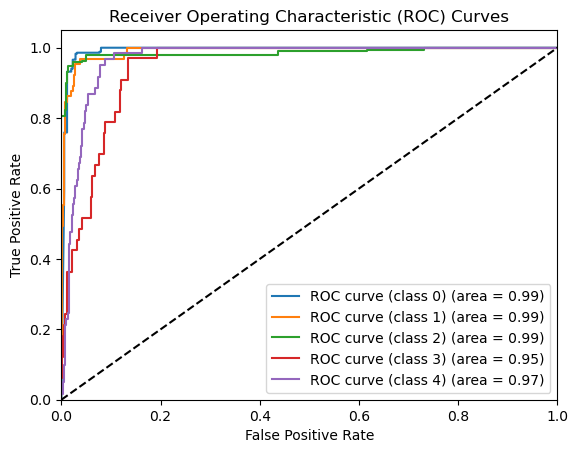

In [37]:
def generate_augmented_data(generator, steps):
    images = []
    labels = []
    for _ in range(steps):
        batch_images, batch_labels = next(generator)
        images.append(batch_images)
        labels.append(batch_labels)
    images = np.vstack(images)
    labels = np.hstack(labels)
    return images, labels
val_steps = len(val_images) // 32
aug_val_images, aug_val_labels = generate_augmented_data(val_generator, val_steps)
y_pred = custom_model.model.predict(aug_val_images)
y_pred_classes = np.argmax(y_pred, axis=1)
precision = precision_score(aug_val_labels, y_pred_classes, average='weighted')
recall = recall_score(aug_val_labels, y_pred_classes, average='weighted')
f1 = f1_score(aug_val_labels, y_pred_classes, average='weighted')
accuracy = accuracy_score(aug_val_labels, y_pred_classes)
class_precisions = precision_score(aug_val_labels, y_pred_classes, average=None)
class_recalls = recall_score(aug_val_labels, y_pred_classes, average=None)
class_f1s = f1_score(aug_val_labels, y_pred_classes, average=None)
class_accuracies = [accuracy_score(aug_val_labels[aug_val_labels == i], y_pred_classes[aug_val_labels == i]) for i in range(5)]
metrics_df = pd.DataFrame({
    'Class': [f'Class {i}' for i in range(5)],
    'Precision': class_precisions,
    'Recall': class_recalls,
    'F1 Score': class_f1s,
    'Accuracy': class_accuracies
})

overall_metrics = pd.DataFrame({
    'Class': ['Overall'],
    'Precision': [precision],
    'Recall': [recall],
    'F1 Score': [f1],
    'Accuracy': [accuracy]
})

metrics_df = pd.concat([metrics_df, overall_metrics], ignore_index=True)
print(tabulate(metrics_df, headers='keys', tablefmt='grid'))
auc = roc_auc_score(aug_val_labels, y_pred, multi_class='ovr', average='macro')
print(f"AUC Score: {auc:.4f}")

fpr = {}
tpr = {}
roc_auc = {}
aug_val_labels_one_hot = np.zeros((aug_val_labels.size, aug_val_labels.max() + 1))
aug_val_labels_one_hot[np.arange(aug_val_labels.size), aug_val_labels] = 1
for i in range(5):  # assuming there are 5 classes
    fpr[i], tpr[i], _ = roc_curve(aug_val_labels_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = roc_auc_score(aug_val_labels_one_hot[:, i], y_pred[:, i])
# Plotting the ROC curves.
plt.figure()
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve (class {i}) (area = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()


### Confusion Matrix for Resnet50 Model.

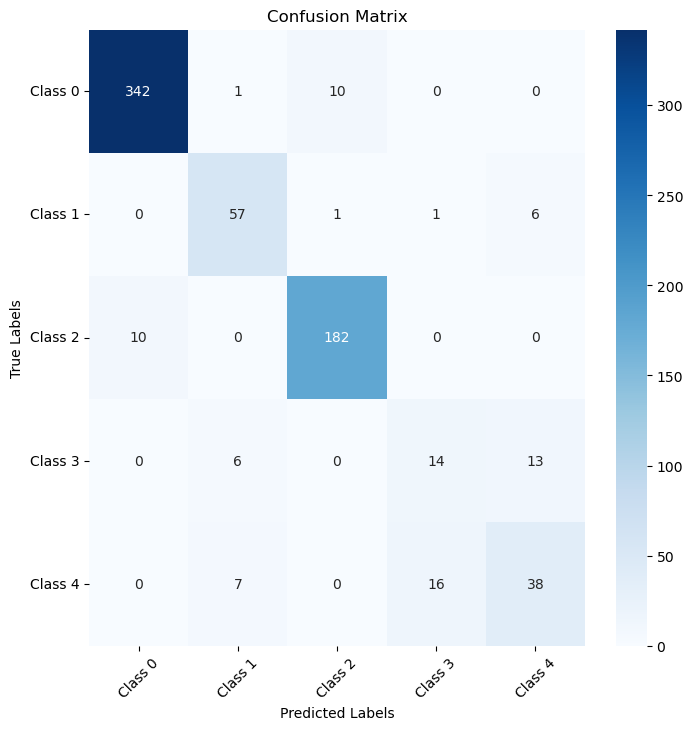

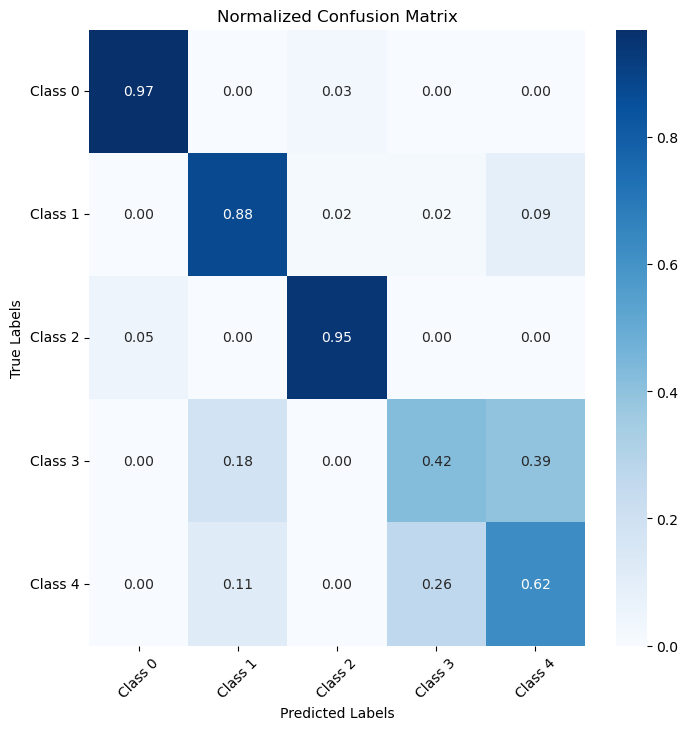

In [38]:
conf_matrix = confusion_matrix(aug_val_labels, y_pred_classes)
conf_matrix_norm = confusion_matrix(aug_val_labels, y_pred_classes, normalize='true')
plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=[f'Class {i}' for i in range(5)], yticklabels=[f'Class {i}' for i in range(5)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()
plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix_norm, annot=True, fmt=".2f", cmap='Blues', xticklabels=[f'Class {i}' for i in range(5)], yticklabels=[f'Class {i}' for i in range(5)])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Normalized Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

## Prediction on test set.

### A Final file is provided called predictions.csv with the model(ResNet50) predicitng on the test set and providing a diagnosis to eachh image in test set.

In [40]:
# Predictions are made on the test set and a Predictions.csv file is provided to the user.
predictions = custom_model.model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

test_df['diagnosis'] = predicted_labels
test_df.to_csv('predictions.csv', index=False)

61/61 ━━━━━━━━━━━━━━━━━━━━ 68s 1s/step
